# 3D Overthrust data - display results

## Author: M.Ravasi

This notebook displays the results of the various experiments run in the `POCS_Overthrust-Irregular3D.ipynb` and `POCS_Overthrust-Regular3D.ipynb` notebooks.

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

import glob
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import scipy.io as sp_io
import pylops

from pypocs.visual import explode_volume, plotting_style
from pypocs.metric import *

plotting_style()

## Experiments

In [2]:
colors = ['r', 'b', 'g']

experiments = {}

In [3]:
# Irreg 0.4
subname = 'X-Irregular 0.4'
experiments[subname] = {}

subname = 'X-Irregular 0.4'
experiments[subname]['subkind'] = 'irreg'
experiments[subname]['perc_subsampling'] = 0.4
experiments[subname]['niter'] = 80
experiments[subname]['jsnrsave'] = 4
experiments[subname]['xplot'] = 41

experiments[subname]['experiments'] = [
    '../../experiments/Overthrust/Rec_irreg0.4_Affine_IdopTrue_L0_ThNone_hqs_interpolate_niter80.npz',
    #'../../experiments/Overthrust/Rec_irreg0.4_Affine_IdopFalse_L0_Th[0.07]_admm_interpolate_niter80.npz',
    '../../experiments/Overthrust/Rec_irreg0.4_Affine_IdopFalse_L0_Th[0.07]_pd_interpolate_niter80.npz']
experiments[subname]['experimentnames'] = ['POCS',
                                          #'L-ADMM', 
                                          'PD']

In [4]:
# Irreg 3
subname = 'X-Dithirregular 3'
experiments[subname] = {}

experiments[subname]['subkind'] = 'irreg' 
experiments[subname]['perc_subsampling'] = 3
experiments[subname]['niter'] = 80
experiments[subname]['jsnrsave'] = 4
experiments[subname]['xplot'] = 43

experiments[subname]['experiments'] = [
    '../../experiments/Overthrust/Rec_irreg3_Affine_IdopTrue_L0_ThNone_hqs_interpolate_niter80.npz',
    #'../../experiments/Overthrust/Rec_irreg3_Affine_IdopFalse_L0_Th[0.05]_admm_interpolate_niter80.npz',
    '../../experiments/Overthrust/Rec_irreg3_Affine_IdopFalse_L0_Th[0.05]_pd_interpolate_niter80.npz']
experiments[subname]['experimentnames'] = ['POCS',
                                          #'L-ADMM', 
                                          'PD']

In [5]:
# Fullirreg 0.2
subname = 'XY-Irregular 0.2'
experiments[subname] = {}

experiments[subname]['subkind'] = 'fullirreg' 
experiments[subname]['perc_subsampling'] = 0.2
experiments[subname]['niter'] = 80
experiments[subname]['jsnrsave'] = 4
experiments[subname]['xplot'] = 41

experiments[subname]['experiments'] = [
    '../../experiments/Overthrust/Rec_fullirreg0.2_Affine_IdopTrue_L0_ThNone_hqs_interpolate_niter80.npz',
    #'../../experiments/Overthrust/Rec_fullirreg0.2_Affine_IdopFalse_L0_Th[0.05]_admm_interpolate_niter80.npz',
    '../../experiments/Overthrust/Rec_fullirreg0.2_Affine_IdopFalse_L0_Th[0.05]_pd_interpolate_niter80.npz']
experiments[subname]['experimentnames'] = ['POCS',
                                           #'L-ADMM', 
                                           'PD']

In [6]:
# Fullirreg 3
subname = 'XY-Dithirregular 3'
experiments[subname] = {}

experiments[subname]['subkind'] = 'fullirreg' 
experiments[subname]['perc_subsampling'] = 3
experiments[subname]['niter'] = 80
experiments[subname]['jsnrsave'] = 4
experiments[subname]['xplot'] = 41

experiments[subname]['experiments'] = [
    '../../experiments/Overthrust/Rec_fullirreg3_Affine_IdopTrue_L0_ThNone_hqs_interpolate_niter80.npz',
    #'../../experiments/Overthrust/Rec_fullirreg3_Affine_IdopFalse_L0_Th[0.05]_admm_interpolate_niter80.npz',
    '../../experiments/Overthrust/Rec_fullirreg3_Affine_IdopFalse_L0_Th[0.05]_pd_interpolate_niter80.npz']
experiments[subname]['experimentnames'] = ['POCS',
                                           #'L-ADMM', 
                                           'PD']

In [7]:
experiments

{'X-Irregular 0.4': {'subkind': 'irreg',
  'perc_subsampling': 0.4,
  'niter': 80,
  'jsnrsave': 4,
  'xplot': 41,
  'experiments': ['../../experiments/Overthrust/Rec_irreg0.4_Affine_IdopTrue_L0_ThNone_hqs_interpolate_niter80.npz',
   '../../experiments/Overthrust/Rec_irreg0.4_Affine_IdopFalse_L0_Th[0.07]_pd_interpolate_niter80.npz'],
  'experimentnames': ['POCS', 'PD']},
 'X-Dithirregular 3': {'subkind': 'irreg',
  'perc_subsampling': 3,
  'niter': 80,
  'jsnrsave': 4,
  'xplot': 43,
  'experiments': ['../../experiments/Overthrust/Rec_irreg3_Affine_IdopTrue_L0_ThNone_hqs_interpolate_niter80.npz',
   '../../experiments/Overthrust/Rec_irreg3_Affine_IdopFalse_L0_Th[0.05]_pd_interpolate_niter80.npz'],
  'experimentnames': ['POCS', 'PD']},
 'XY-Irregular 0.2': {'subkind': 'fullirreg',
  'perc_subsampling': 0.2,
  'niter': 80,
  'jsnrsave': 4,
  'xplot': 41,
  'experiments': ['../../experiments/Overthrust/Rec_fullirreg0.2_Affine_IdopTrue_L0_ThNone_hqs_interpolate_niter80.npz',
   '../../exp

## Visualize

In [8]:
# Geometry
ny, nx, nz = 200, 330, 155
nrx, nry = 176, 80

y, x, z = np.arange(ny)*15., np.arange(nx)*15., np.arange(nz)*15.
recx = np.arange(700,x[-1]-700, 20)[:nrx]
recy = np.arange(600,y[-1]-600, 20)[:nry]

ns, nr, nt = 176, 80, 500
dx, dt = 20, 0.004
nfft=2**9
ifmax = 90

X-Irregular 0.40
Effective perc sub: 0.3977272727272727
POCS
RMSE=0.18723698922899568, SNR=14.552167018884452

PD
RMSE=0.14263023512851253, SNR=16.915768037003144

X-Dithirregular 0.34
Effective perc sub: 0.3352272727272727
POCS
RMSE=0.37266479924236157, SNR=8.5736325482923

PD
RMSE=0.14254343011066756, SNR=16.921055894335172

XY-Irregular 0.20
Effective perc sub: 0.2
POCS
RMSE=0.12052858967558021, SNR=18.37819850317071

PD
RMSE=0.1163053757276457, SNR=18.68800422737476

XY-Dithirregular 0.11
Effective perc sub: 0.11271306818181819
POCS
RMSE=0.20504751031891788, SNR=13.76290999071646

PD
RMSE=0.17365666242609182, SNR=15.206171002102371



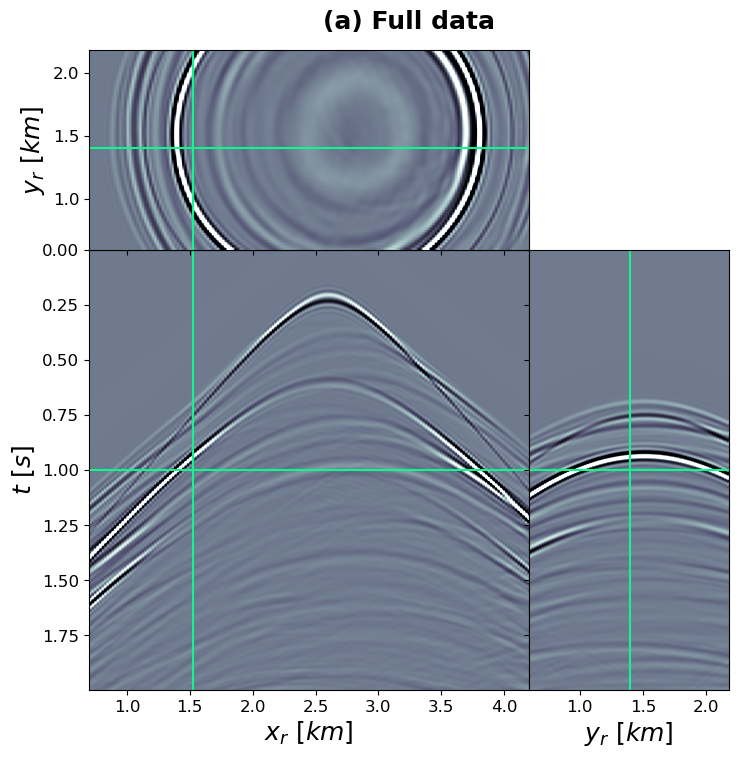

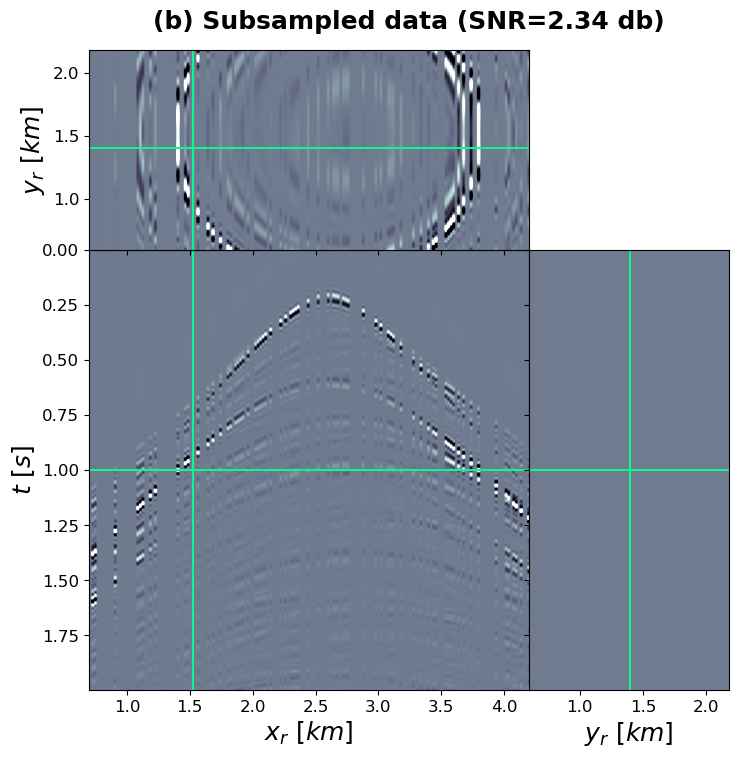

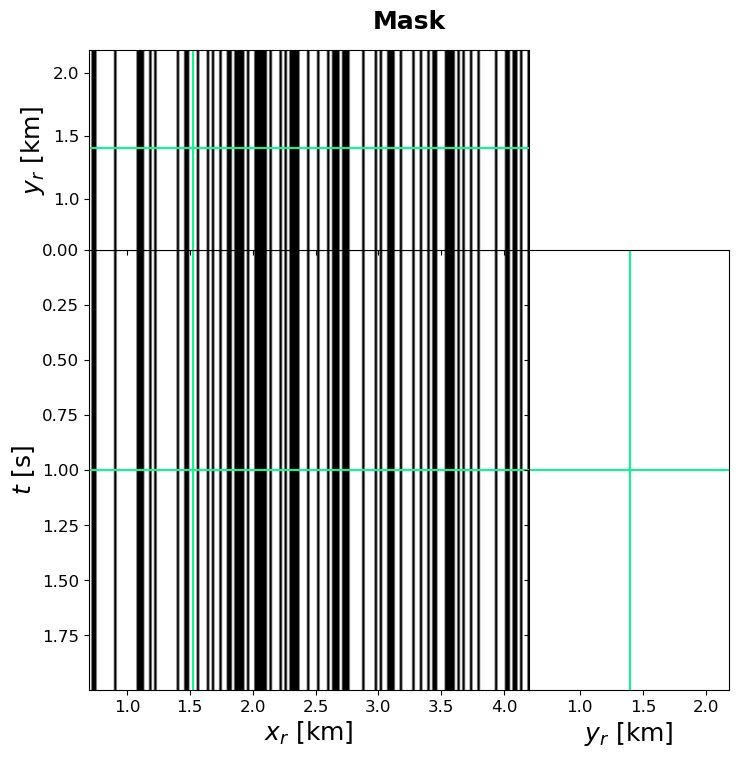

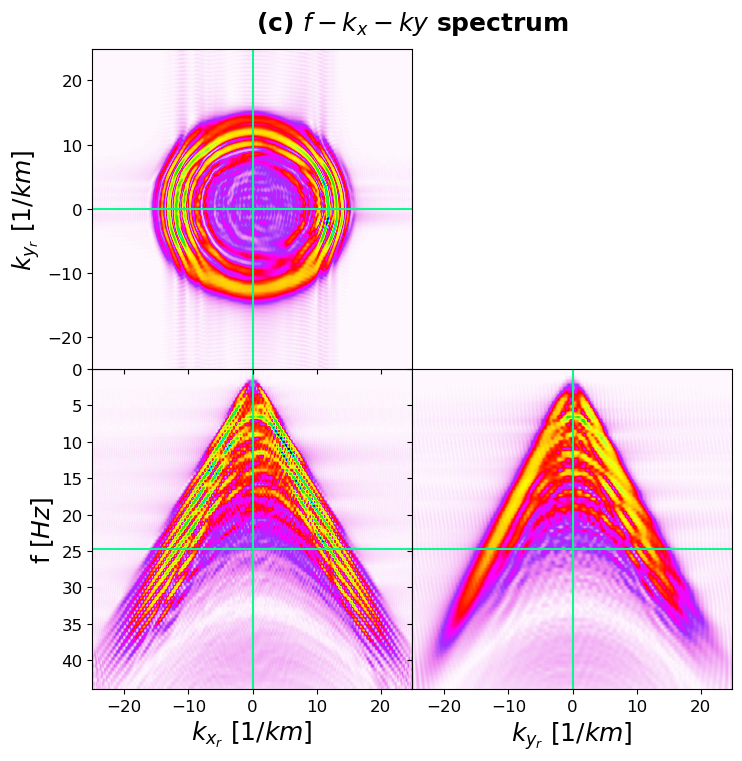

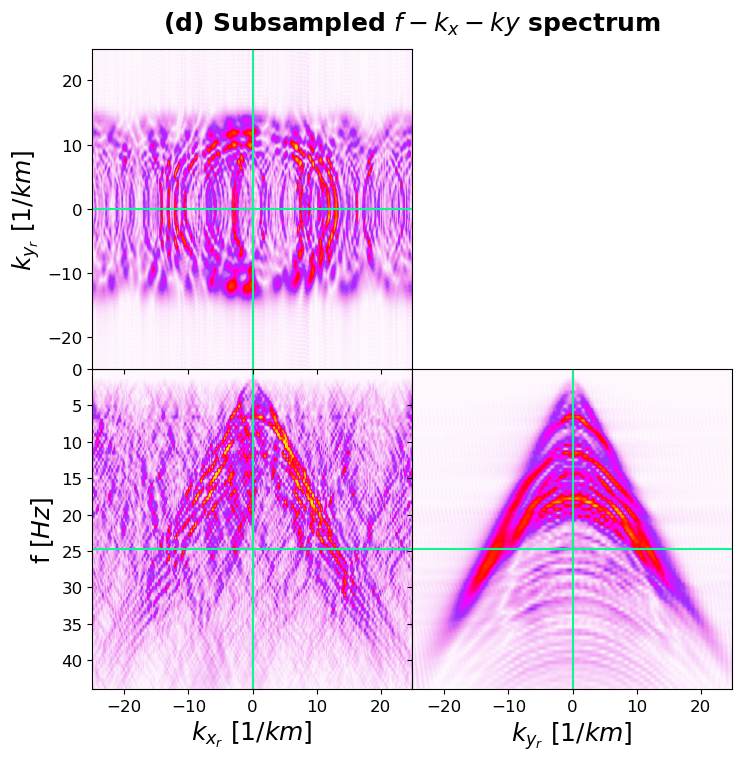

...

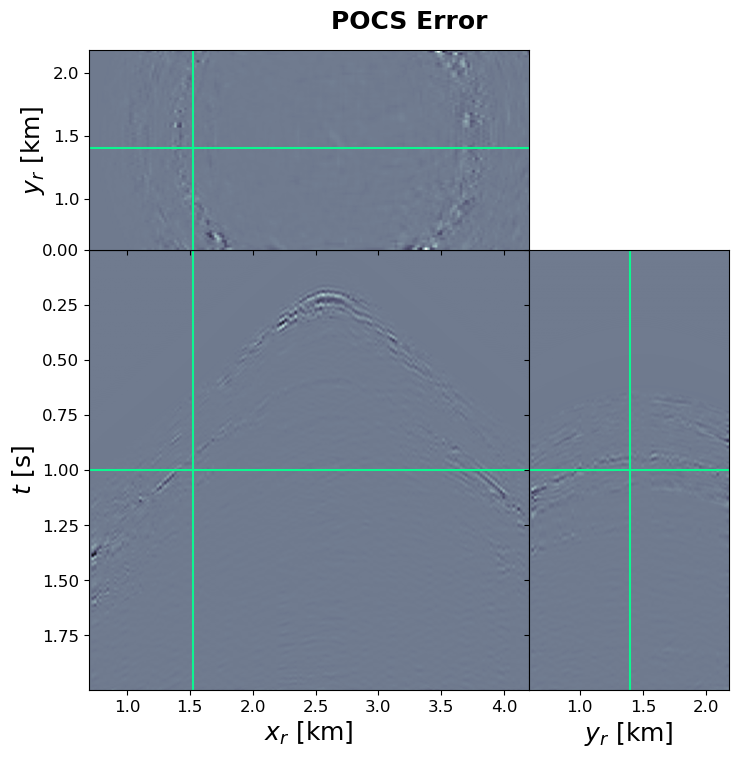

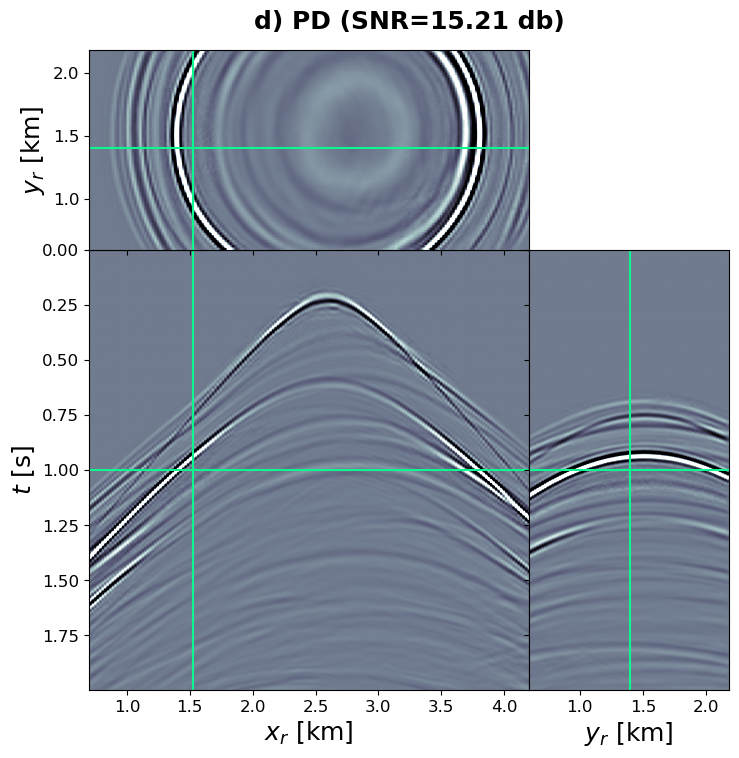

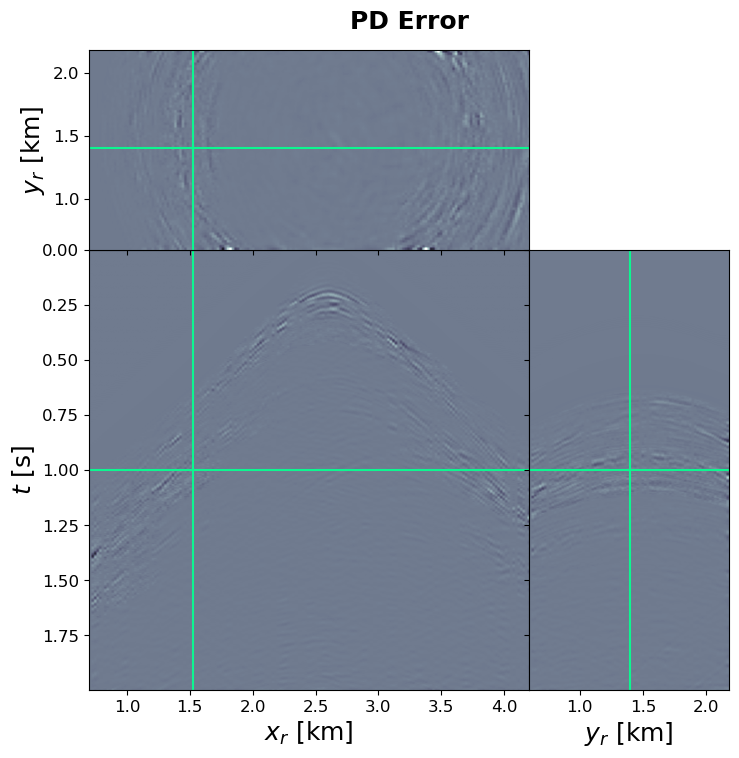

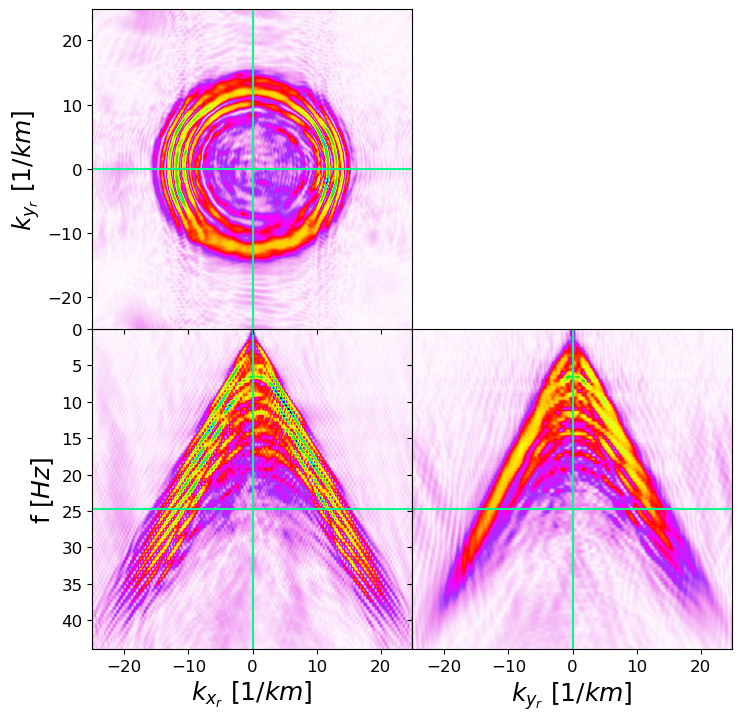

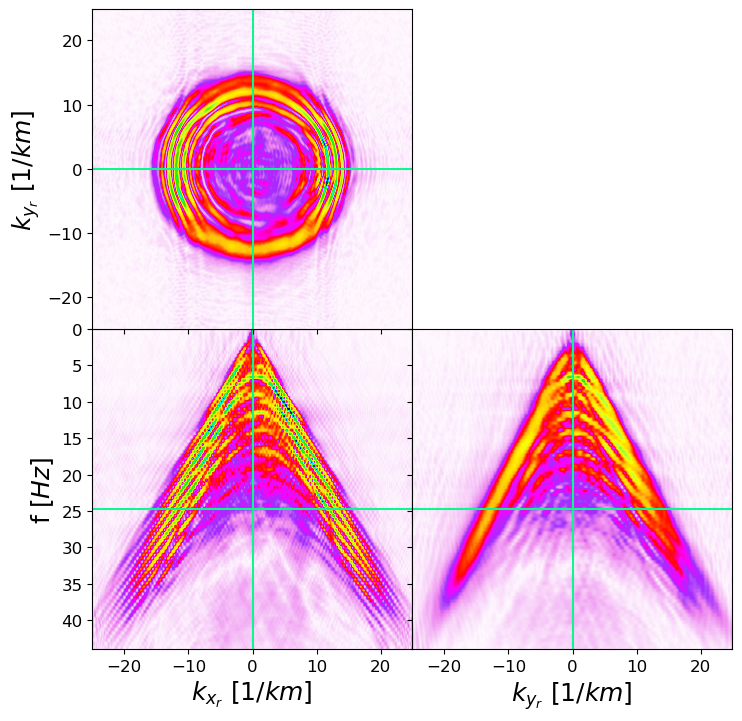

In [9]:
for exp in experiments.keys():
    
    subkind = experiments[exp]['subkind']
    perc_subsampling = experiments[exp]['perc_subsampling']
    niter = experiments[exp]['niter']
    
    # Load data
    f = np.load(f'../../experiments/Overthrust/Rec_{subkind}{perc_subsampling}_data.npz')
    data = f['data']
    mask = f['mask']
    datamasked = f['datamasked']
    directmask = f['direct_mask']

    # Perc subsampling
    experiments[exp]['effective_perc_subsampling'] = np.sum(mask) / mask.size
    
    experiments[exp]['effective_subname'] = f"{exp.split()[0]} {experiments[exp]['effective_perc_subsampling']:.2f}"
    print(experiments[exp]['effective_subname'])
    print('Effective perc sub:', experiments[exp]['effective_perc_subsampling'])


    # Time axis
    t = np.arange(0, data.shape[2]) * 0.004
    gain = t**1.5
    gain = gain[:, np.newaxis, np.newaxis]
    
    # Data
    explode_volume(data.transpose(2, 0, 1) * gain, x=experiments[exp]['xplot'], 
                   tlim=[0, t[-1]], tlabel=r'$t$',
                   xlim=[recx[0]/1e3, recx[-1]/1e3], xlabel=r'$x_r$',
                   ylim=[recy[0]/1e3, recy[-1]/1e3], ylabel=r'$y_r$',
                   labels= (r'$[s]$', r'$[km]$', r'$[km]$'), #ratio=((nrx * 0.6, nry), (nry*1.5, nrx)), 
                   clipval=(-0.1,0.1), figsize=(8, 8), title='(a) Full data')
    plt.savefig('../../figs/Overthrust/data.eps')

    _, snr = metrics(data, directmask*datamasked, itmin=0)
    explode_volume(datamasked.transpose(2, 0, 1) * gain, x=experiments[exp]['xplot'], 
                   tlim=[0, t[-1]], tlabel=r'$t$',
                   xlim=[recx[0]/1e3, recx[-1]/1e3], xlabel=r'$x_r$',
                   ylim=[recy[0]/1e3, recy[-1]/1e3], ylabel=r'$y_r$',
                   labels= (r'$[s]$', r'$[km]$', r'$[km]$'),
                   clipval=(-0.1,0.1), figsize=(8, 8), title=f'(b) Subsampled data (SNR={snr:.2f} db)')
    plt.savefig(f'../../figs/Overthrust/maskeddata_{subkind}{perc_subsampling}.eps')

    explode_volume(mask.transpose(2, 0, 1), x=experiments[exp]['xplot'], 
                   tlim=[0, t[-1]], tlabel=r'$t$',
                   xlim=[recx[0]/1e3, recx[-1]/1e3], xlabel=r'$x_r$',
                   ylim=[recy[0]/1e3, recy[-1]/1e3], ylabel=r'$y_r$',
                   labels= ('[s]', '[km]', '[km]'),
                   cmap='gray_r', clipval=(0, 1), figsize=(8, 8), title='Mask')
    
    # Spectra
    FFTop = pylops.signalprocessing.FFTND(dims=[ns, nr, nt], nffts=[nfft, nfft, nfft],
                                          sampling=[dx, dx, dt], real=True)

    datafk = FFTop @ data
    datamaskedfk = FFTop @ datamasked

    explode_volume(np.fft.fftshift(np.abs(datafk[..., :ifmax]),axes=(0,1)).transpose(2, 0, 1), t=50,
                   tlim=[0,FFTop.fs[-1][ifmax]], tlabel='f',
                   xlim=[1e3*FFTop.fs[0][nfft//2], 1e3*FFTop.fs[0][nfft//2-1]], xlabel=r'$k_{x_r}$',
                   ylim=[1e3*FFTop.fs[1][nfft//2], 1e3*FFTop.fs[1][nfft//2-1]], ylabel=r'$k_{y_r}$',
                   labels= (r'$[Hz]$', r'$[1/km]$', r'$[1/km]$'), title=r'(c) $f-k_x-ky$ spectrum',
                   cmap='gist_ncar_r', figsize=(8, 8), clipval=(0,0.2))#, title='Data')
    plt.savefig(f'../../figs/Overthrust/datafk.eps')

    explode_volume(np.fft.fftshift(np.abs(datamaskedfk[..., :ifmax]),axes=(0,1)).transpose(2, 0, 1), t=50,
                   tlim=[0,FFTop.fs[-1][ifmax]], tlabel='f',
                   xlim=[1e3*FFTop.fs[0][nfft//2], 1e3*FFTop.fs[0][nfft//2-1]], xlabel=r'$k_{x_r}$',
                   ylim=[1e3*FFTop.fs[1][nfft//2], 1e3*FFTop.fs[1][nfft//2-1]], ylabel=r'$k_{y_r}$',
                   labels= (r'$[Hz]$', r'$[1/km]$', r'$[1/km]$'), title=r'(d) Subsampled $f-k_x-ky$ spectrum',                  
                   cmap='gist_ncar_r', figsize=(8, 8), clipval=(0,0.2)), 
    plt.savefig(f'../../figs/Overthrust/datafk_{subkind}{perc_subsampling}.eps');
    
    # Reconstructions
    for experiment, expname in zip(experiments[exp]['experiments'], experiments[exp]['experimentnames']):
        if expname is None: expname = ('_'.join(experiment.split('/')[-1].split('_')[2:]))[:-4]
        f = np.load(experiment, allow_pickle=True)
        datarec = f['datarec']
        print(expname)
        _, snr = metrics(data, directmask*datarec, itmin=0, verb=True)
        print()
    
        numbering = 'c)' if 'POCS' in expname else 'd)'
        fig, axs = explode_volume((datarec).transpose(2, 0, 1) * gain, x=experiments[exp]['xplot'], 
                           tlim=[0, t[-1]], tlabel=r'$t$',
                           xlim=[recx[0]/1e3, recx[-1]/1e3], xlabel=r'$x_r$',
                           ylim=[recy[0]/1e3, recy[-1]/1e3], ylabel=r'$y_r$',
                           labels= ('[s]', '[km]', '[km]'),
                           clipval=(-0.1,0.1), figsize=(8, 8), 
                           title=f'{numbering} {expname} (SNR={snr:.2f} db)')
        plt.savefig(f'../../figs/Overthrust/{expname}_{subkind}{perc_subsampling}_niter{niter}.eps')

        explode_volume((data-datarec).transpose(2, 0, 1) * gain, x=experiments[exp]['xplot'], 
                       tlim=[0, t[-1]], tlabel=r'$t$',
                       xlim=[recx[0]/1e3, recx[-1]/1e3], xlabel=r'$x_r$',
                       ylim=[recy[0]/1e3, recy[-1]/1e3], ylabel=r'$y_r$',
                       labels= ('[s]', '[km]', '[km]'),
                       clipval=(-0.1,0.1), figsize=(8, 8), 
                       title=f'{expname} Error')
        plt.savefig(f'../../figs/Overthrust/{expname}_{subkind}{perc_subsampling}_niter{niter}_error.eps')
    
    # Spectra of Reconstructions
    for experiment, expname in zip(experiments[exp]['experiments'], experiments[exp]['experimentnames']):
        if expname is None: expname = ('_'.join(experiment.split('/')[-1].split('_')[2:]))[:-4]
        f = np.load(experiment, allow_pickle=True)
        datarec = f['datarec']
    
        datarecfk = FFTop @ datarec
        explode_volume(np.fft.fftshift(np.abs(datarecfk[..., :ifmax]),axes=(0,1)).transpose(2, 0, 1), t=50,
                       tlim=[0,FFTop.fs[-1][ifmax]], tlabel='f',
                       xlim=[1e3*FFTop.fs[0][nfft//2], 1e3*FFTop.fs[0][nfft//2-1]], xlabel=r'$k_{x_r}$',
                       ylim=[1e3*FFTop.fs[1][nfft//2], 1e3*FFTop.fs[1][nfft//2-1]], ylabel=r'$k_{y_r}$',
                       labels= (r'$[Hz]$', r'$[1/km]$', r'$[1/km]$'),                   
                       cmap='gist_ncar_r', figsize=(8, 8), clipval=(0,0.2))#title=f'{expname} (SNR={snr:.2f} db)')
        plt.savefig(f'../../figs/Overthrust/{expname}_{subkind}{perc_subsampling}_niter{niter}_fk.png');

POCS - SNR = 14.552167018884452
PD - SNR = 16.915768037003144
POCS - SNR = 8.5736325482923
PD - SNR = 16.921055894335172
POCS - SNR = 18.37819850317071
PD - SNR = 18.68800422737476
POCS - SNR = 13.76290999071646
PD - SNR = 15.206171002102371


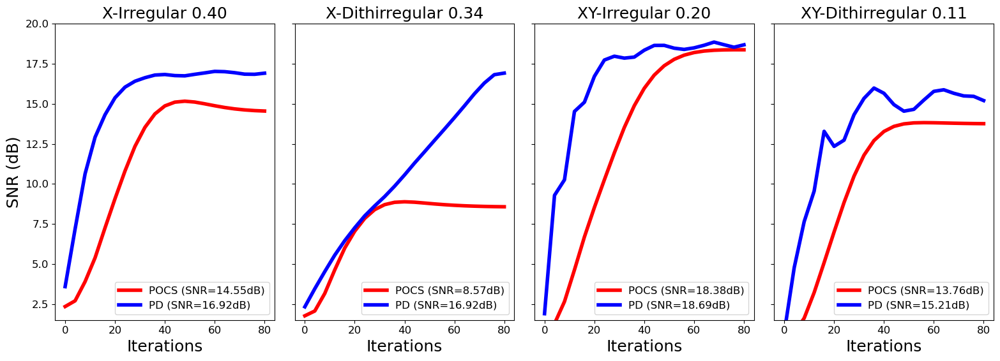

In [10]:
fig, axs = plt.subplots(1, 4, sharey=True, figsize=(16, 6))
for iexp, exp in enumerate(experiments.keys()):
    
    subkind = experiments[exp]['subkind']
    perc_subsampling = experiments[exp]['perc_subsampling']
    niter = experiments[exp]['niter']
    jsnrsave = experiments[exp]['jsnrsave']
    
    for experiment, expname, color in zip(experiments[exp]['experiments'], experiments[exp]['experimentnames'], colors):
        if expname is None: expname = ('_'.join(experiment.split('/')[-1].split('_')[2:]))[:-4]
        f = np.load(experiment, allow_pickle=True)
        snr = f['snr']
        print(f'{expname} - SNR = {snr[-1]}')
        axs[iexp].plot(np.arange(0, niter+1, jsnrsave), snr,
                       color, lw=4, label=f'{expname} (SNR={snr[-1]:.2f}dB)')
    axs[iexp].set_title(experiments[exp]['effective_subname'])
    axs[iexp].set_xlabel('Iterations')
    if subname == 'X-Irregular 0.4':
        plt.ylabel('SNR')
    axs[iexp].set_ylim(1.5, 20)
    axs[iexp].legend(fontsize=12, loc='lower right')
axs[0].set_ylabel('SNR (dB)')
plt.tight_layout()
plt.savefig(f'../../figs/Overthrust/SNRsummary.eps', dpi=150, bbox_inches='tight');